In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.metrics import classification_report
import shutil
from glob import glob
from PIL import Image
from keras.preprocessing.image import ImageDataGenerator
np.random.seed(42)
from keras.utils.np_utils import to_categorical # used for converting labels to one-hot-encoding
from sklearn.model_selection import train_test_split
from scipy import stats
from sklearn.preprocessing import LabelEncoder
import autokeras as ak
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from sklearn.metrics import confusion_matrix
import splitfolders

In [4]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')

In [6]:
physical_devices

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [7]:
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [8]:
skin_df = pd.read_csv('dataverse_files/HAM10000_metadata')

In [13]:
skin_df.

,age
count,9958.000000
mean,51.863828
std,16.968614
min,0.000000
25%,40.000000
50%,50.000000
75%,65.000000
max,85.000000


In [7]:
skin_df['dx'].value_counts()

nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: dx, dtype: int64

The 7 classes of skin cancer lesions included in this dataset are:

- Melanocytic nevi (nv)
- Melanoma (mel)
- Benign keratosis-like lesions (bkl)
- Basal cell carcinoma (bcc) 
- Actinic keratoses (akiec)
- Vascular lesions (vas)
- Dermatofibroma (df)

In [ ]:
skin

In [8]:
#Now time to read images based on image ID from the CSV file
#This is the safest way to read images as it ensures the right image is read for the right ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x 
              for x in glob(os.path.join('dataverse_files/', '*', '*.jpg'))}

In [9]:
#Define the path and add as a new column
skin_df['path'] = skin_df['image_id'].map(image_path.get)

In [10]:
#Use the path to read images.
skin_df['image'] = skin_df['path'].map(lambda x: np.asarray(Image.open(x).resize((224,224))))

In [11]:
print(skin_df['dx'].value_counts())

nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: dx, dtype: int64


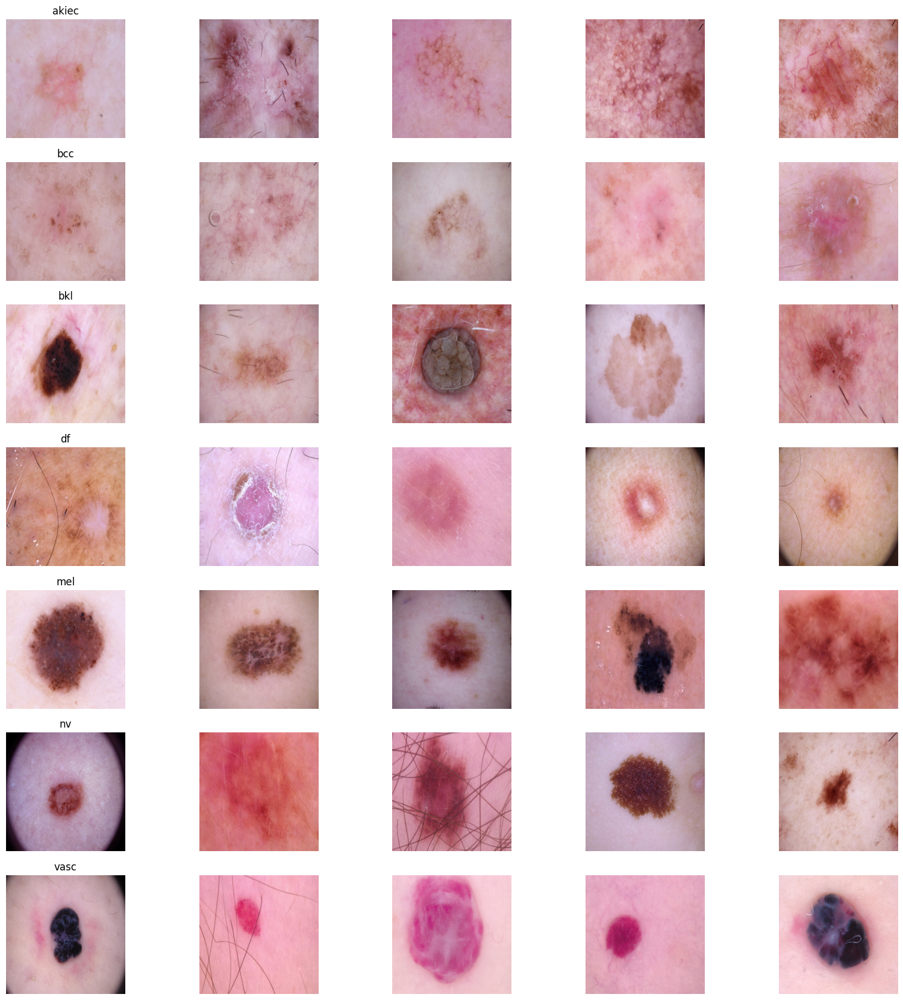

In [17]:
n_samples = 5  # number of samples for plotting
# Plotting
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

In [18]:
#############################################################################
# Reorganize data into subfolders based on their labels
#then use keras flow_from_dir or pytorch ImageFolder to read images with 
#folder names as labels


# Dump all images into a folder and specify the path:
data_dir = os.getcwd() + "\\data\\all_images\\"

# Path to destination directory where we want subfolders
dest_dir = os.getcwd() + "\\data\\reorganized\\"

In [19]:
os.getcwd()

'C:\\Users\\asus\\Desktop\\Dissertation'

In [20]:
# Read the csv file containing image names and corresponding labels
skin_df2 = pd.read_csv('dataverse_files/HAM10000_metadata')
print(skin_df['dx'].value_counts())

label=skin_df2['dx'].unique().tolist()  #Extract labels into a list
label_images = []

nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: dx, dtype: int64


In [21]:
# Copy images to new folders
for i in label:
    os.makedirs(dest_dir + str(i) + "\\")
    sample = skin_df2[skin_df2['dx'] == i]['image_id']
    label_images.extend(sample)
    for id in label_images:
        shutil.copyfile((data_dir + id +".jpg"), (dest_dir + i + "\\"+id+".jpg"))
    label_images=[]

In [ ]:
#Now we are ready to work with images in subfolders
    
### FOR Keras datagen ##################################
#flow_from_directory Method
#useful when the images are sorted and placed in there respective class/label folders
#identifies classes automatically from the folder name. 
# create a data generator

In [22]:
#Define datagen. Here we can define any transformations we want to apply to images
datagen = ImageDataGenerator()

In [23]:
# define training directory that contains subfolders
train_dir = os.getcwd() + "\\data\\reorganized\\"
#USe flow_from_directory
train_data_keras = datagen.flow_from_directory(directory= train_dir, class_mode='categorical',
                                               batch_size= 128,  #16 images at a time
                                               target_size=(224,224))  #Resize images

Found 10015 images belonging to 7 classes.


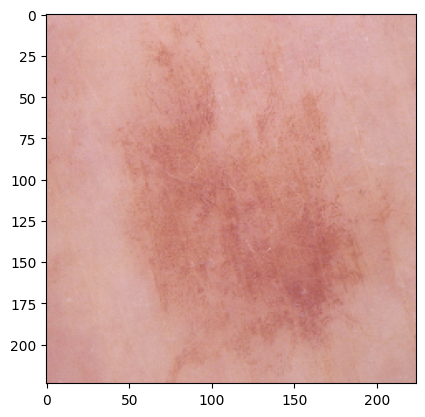

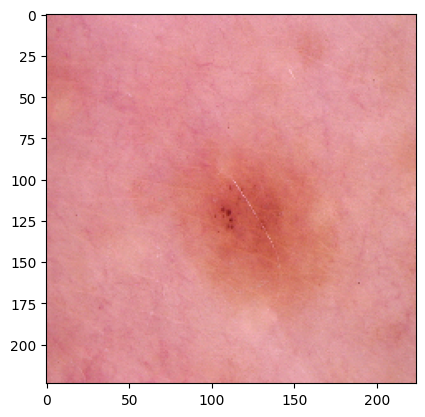

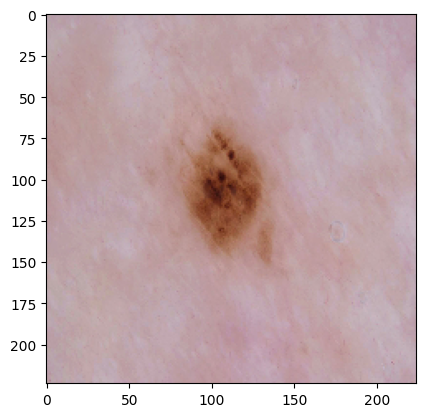

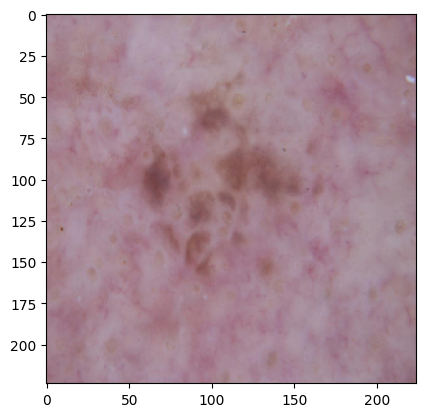

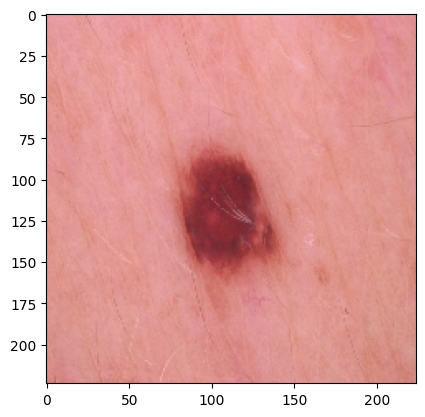

...

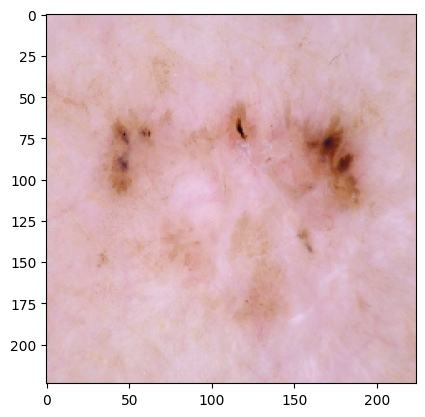

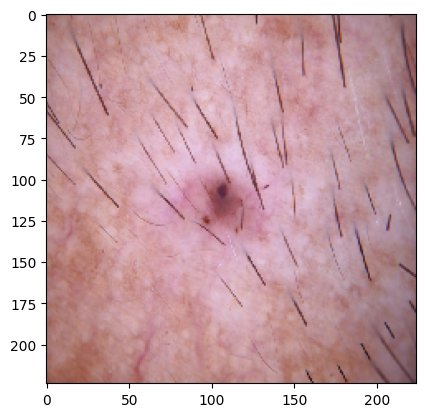

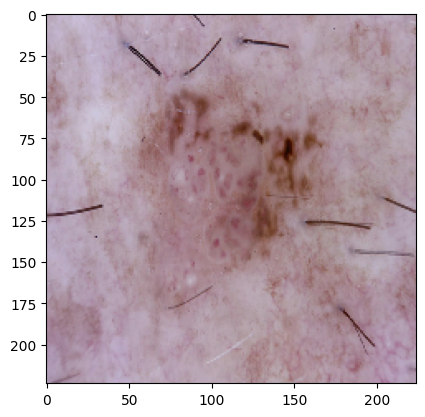

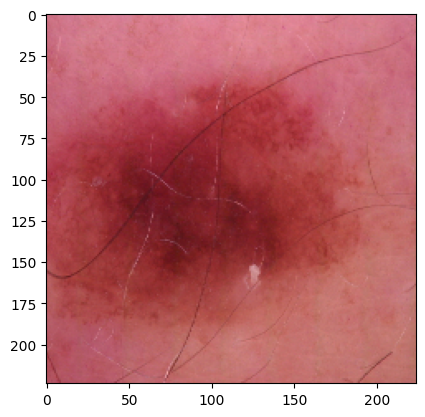

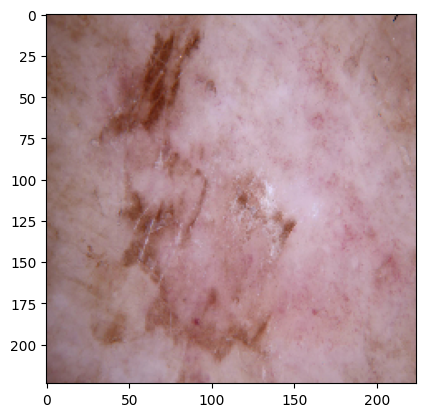

In [24]:
#We can check images for a single batch.
x, y = next(train_data_keras)
#View each image
for i in range (0,15):
    image = x[i].astype(int)
    plt.imshow(image)
    plt.show()

#Now you can train via model.fit_generator

In [9]:
SIZE=224

In [26]:
# label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
LabelEncoder()
print(list(le.classes_))

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']


In [27]:
skin_df['label'] = le.transform(skin_df["dx"]) 
print(skin_df.sample(10))

        lesion_id      image_id     dx    dx_type   age     sex  \
851   HAM_0004004  ISIC_0029872    bkl  consensus  65.0  female   
4868  HAM_0004057  ISIC_0026635     nv  follow_up  65.0    male   
1819  HAM_0004302  ISIC_0033029    mel      histo  60.0    male   
8191  HAM_0000182  ISIC_0026270     nv      histo  60.0    male   
9349  HAM_0003027  ISIC_0025355     nv  consensus  35.0  female   
1378  HAM_0006214  ISIC_0032190    mel      histo  60.0    male   
3473  HAM_0003960  ISIC_0026256     nv  follow_up  45.0    male   
9140  HAM_0003434  ISIC_0028608     nv      histo  30.0  female   
3497  HAM_0005229  ISIC_0030003     nv  follow_up  35.0    male   
9841  HAM_0002615  ISIC_0033413  akiec      histo  70.0    male   

         localization        dataset  \
851             chest   vidir_modern   
4868            trunk  vidir_molemax   
1819          abdomen   vidir_modern   
8191             neck    vienna_dias   
9349             back   vidir_modern   
1378  upper extremity 

C:\Users\asus\AppData\Local\Temp\ipykernel_18224\1848369455.py:22: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(sample_age['age'], fit=stats.norm, color='red');


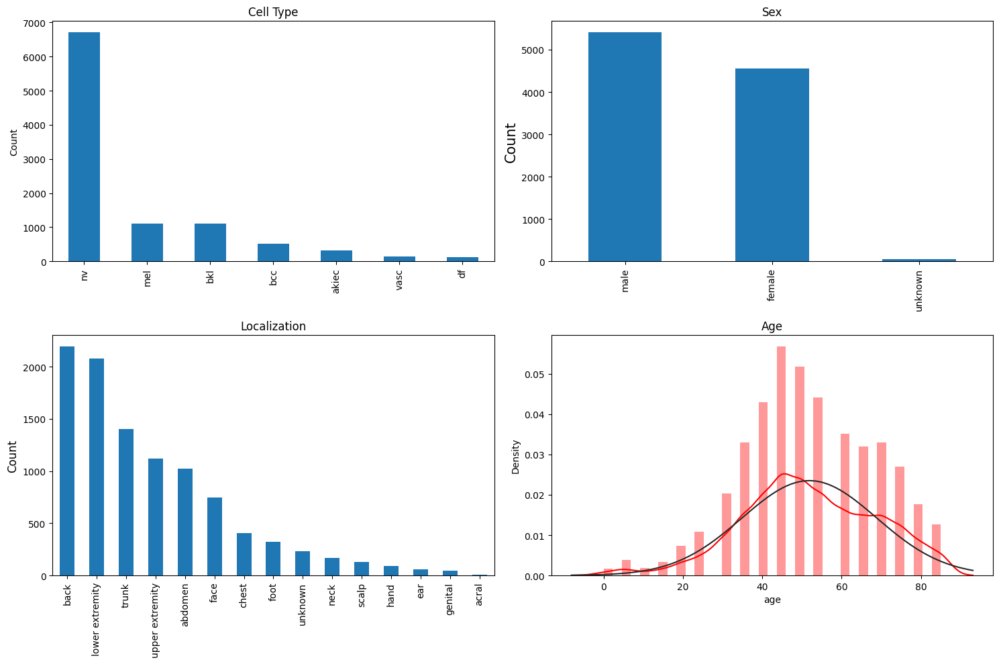

In [28]:
# Data distribution visualization
fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type');

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex');

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count',size=12)
ax3.set_title('Localization')


ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.distplot(sample_age['age'], fit=stats.norm, color='red');
ax4.set_title('Age')

plt.tight_layout()
plt.show()

In [29]:
# Distribution of data into various classes 
from sklearn.utils import resample
print(skin_df['label'].value_counts())

5    6705
4    1113
2    1099
1     514
0     327
6     142
3     115
Name: label, dtype: int64


In [30]:
#Balance data.
# Many ways to balance data... you can also try assigning weights during model.fit
#Separate each classes, resample, and combine back into single dataframe

df_0 = skin_df[skin_df['label'] == 0]
df_1 = skin_df[skin_df['label'] == 1]
df_2 = skin_df[skin_df['label'] == 2]
df_3 = skin_df[skin_df['label'] == 3]
df_4 = skin_df[skin_df['label'] == 4]
df_5 = skin_df[skin_df['label'] == 5]
df_6 = skin_df[skin_df['label'] == 6]

In [31]:
n_samples=500 
df_0_balanced = resample(df_0, replace=True, n_samples=n_samples, random_state=42) 
df_1_balanced = resample(df_1, replace=True, n_samples=n_samples, random_state=42) 
df_2_balanced = resample(df_2, replace=True, n_samples=n_samples, random_state=42)
df_3_balanced = resample(df_3, replace=True, n_samples=n_samples, random_state=42)
df_4_balanced = resample(df_4, replace=True, n_samples=n_samples, random_state=42)
df_5_balanced = resample(df_5, replace=True, n_samples=n_samples, random_state=42)
df_6_balanced = resample(df_6, replace=True, n_samples=n_samples, random_state=42)

In [32]:
skin_df_balanced = pd.concat([df_0_balanced, df_1_balanced, 
                              df_2_balanced, df_3_balanced, 
                              df_4_balanced, df_5_balanced, df_6_balanced])

In [33]:
#Now time to read images based on image ID from the CSV file
#This is the safest way to read images as it ensures the right image is read for the right ID
print(skin_df_balanced['label'].value_counts())

0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: label, dtype: int64


In [12]:
splitfolders.ratio("C:\\Users\\asus\\Desktop\\Dissertation\\data\\reorganized\\", 
                   output= "C:\\Users\\asus\\Desktop\\Dissertation\\data\\output\\", seed=1337, ratio=(.9, 0.05, 0.05))

In [34]:
image_path = {os.path.splitext(os.path.basename(x))[0]: x 
              for x in glob(os.path.join('dataverse_files/', '*', '*.jpg'))}

In [35]:
#Define the path and add as a new column
skin_df_balanced['path'] = skin_df['image_id'].map(image_path.get)
#Use the path to read images.
skin_df_balanced['image'] = skin_df_balanced['path'].map(lambda x: np.asarray(Image.open(x).resize((SIZE,SIZE))))

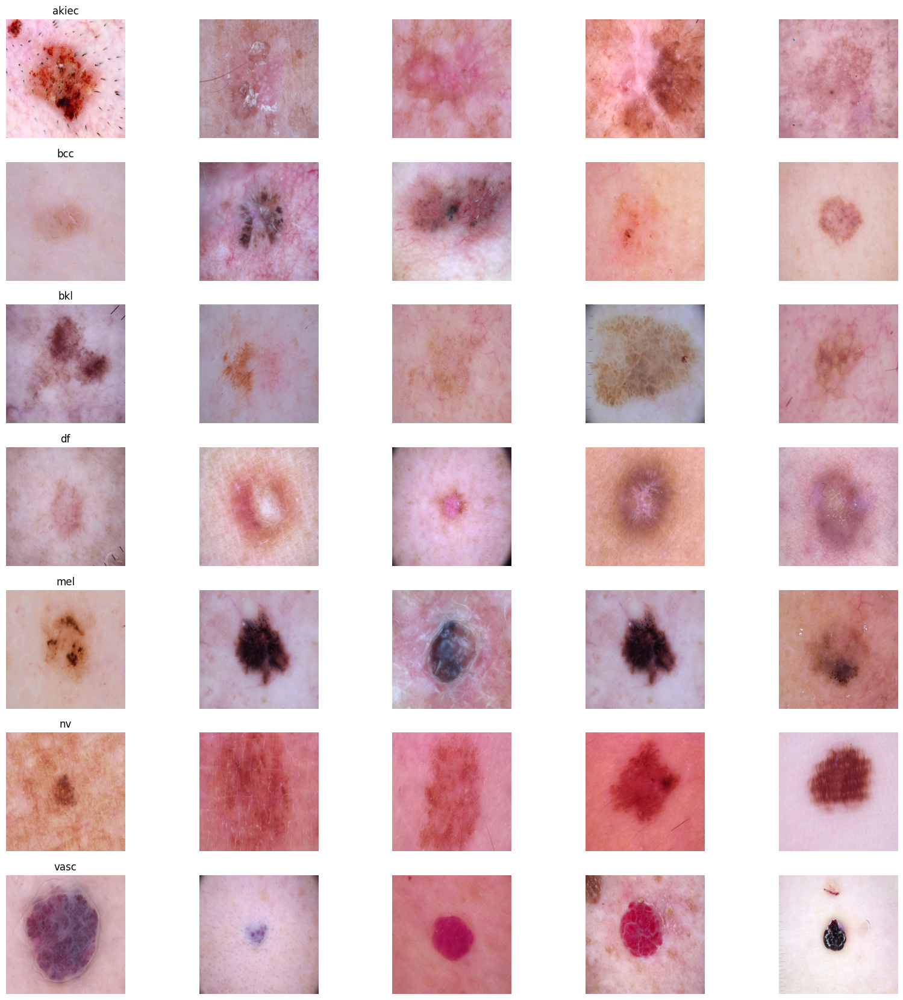

In [36]:
n_samples = 5  

# Plot
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

In [37]:
#Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X/255. # Scale values to 0-1. You can also used standardscaler or other scaling methods.
Y=skin_df_balanced['label'] #Assign label values to Y
Y_cat = to_categorical(Y, num_classes=7) #Convert to categorical as this is a multiclass classification problem
#Split to training and testing. Get a very small dataset for training as we will be 
# fitting it to many potential models. 
x_train_auto, x_test_auto, y_train_auto, y_test_auto = train_test_split(X, Y_cat, test_size=0.95, random_state=42)

In [39]:
import gc
gc.collect()

72495

In [40]:
#Further split data into smaller size to get a small test dataset. 
x_unused, x_valid, y_unused, y_valid = train_test_split(x_test_auto, y_test_auto, test_size=0.05, random_state=42)

MemoryError: Unable to allocate 3.54 GiB for an array with shape (3158, 224, 224, 3) and data type float64

In [20]:
#Define classifier for autokeras. Here we check 25 different models, each model 25 epochs
clf = ak.ImageClassifier(max_trials=25) #MaxTrials - max. number of keras models to try
clf.fit(x_train_auto, y_train_auto, epochs=10)

Trial 25 Complete [00h 00m 02s]
val_loss: 1.1840428113937378

Best val_loss So Far: 1.014707326889038
Total elapsed time: 00h 10m 46s
INFO:tensorflow:Oracle triggered exit
Epoch 1/10
6/6 [==============================] - 0s 24ms/step - loss: 2.6780 - accuracy: 0.1771
Epoch 2/10
6/6 [==============================] - 0s 15ms/step - loss: 1.7425 - accuracy: 0.3543
Epoch 3/10
6/6 [==============================] - 0s 16ms/step - loss: 1.1695 - accuracy: 0.6000
Epoch 4/10
6/6 [==============================] - 0s 16ms/step - loss: 1.0348 - accuracy: 0.6286
Epoch 5/10
6/6 [==============================] - 0s 15ms/step - loss: 0.7755 - accuracy: 0.7714
Epoch 6/10
6/6 [==============================] - 0s 16ms/step - loss: 0.6039 - accuracy: 0.8343
Epoch 7/10
6/6 [==============================] - 0s 16ms/step - loss: 0.4584 - accuracy: 0.9086
Epoch 8/10
6/6 [==============================] - 0s 16ms/step - loss: 0.3382 - accuracy: 0.9486
Epoch 9/10
6/6 [==============================] - 0s

INFO:tensorflow:Assets written to: .\image_classifier\best_model\assets


INFO:tensorflow:Assets written to: .\image_classifier\best_model\assets


In [21]:
#Evaluate the classifier on test data
_, acc = clf.evaluate(x_valid, y_valid)
print("Accuracy = ", (acc * 100.0), "%")

6/6 [==============================] - 0s 44ms/step - loss: 2.3365 - accuracy: 0.4371
Accuracy =  43.71257424354553 %


In [22]:
# get the final best performing model
model = clf.export_model()
print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 cast_to_float32 (CastToFloa  (None, 32, 32, 3)        0         
 t32)                                                            
                                                                 
 normalization (Normalizatio  (None, 32, 32, 3)        7         
 n)                                                              
                                                                 
 conv2d (Conv2D)             (None, 30, 30, 512)       14336     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 512)      0         
 )                                                               
                                                             

In [23]:
#Save the model
model.save('cifar_model.h5')

In [24]:
score = model.evaluate(x_valid, y_valid)
print('Test accuracy:', score[1])

6/6 [==============================] - 0s 45ms/step - loss: 2.3365 - accuracy: 0.4371
Test accuracy: 0.4371257424354553


### Approach B

In [25]:
skin_df = pd.read_csv('dataverse_files/HAM10000_metadata')

In [3]:
SIZE=32

In [27]:
# label encoding to numeric values from text
le = LabelEncoder()
le.fit(skin_df['dx'])
LabelEncoder()
print(list(le.classes_))

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']


In [28]:
 skin_df['label'] = le.transform(skin_df["dx"]) 
print(skin_df.sample(10))

        lesion_id      image_id     dx    dx_type   age     sex  \
9448  HAM_0003208  ISIC_0033572     nv  consensus  35.0    male   
6287  HAM_0003185  ISIC_0030430     nv  follow_up  40.0    male   
7425  HAM_0004615  ISIC_0032815     nv      histo  35.0    male   
3543  HAM_0001188  ISIC_0032162     nv  follow_up  35.0  female   
6601  HAM_0006136  ISIC_0028910     nv  follow_up  40.0  female   
9630  HAM_0003807  ISIC_0033620    bkl  consensus  40.0    male   
3618  HAM_0006100  ISIC_0032288     nv  follow_up  50.0  female   
9748  HAM_0005889  ISIC_0029930  akiec      histo  70.0  female   
2252  HAM_0006899  ISIC_0025128    mel      histo  80.0  female   
8319  HAM_0001157  ISIC_0027423     nv      histo  65.0    male   

         localization        dataset  label  
9448          unknown   vidir_modern      5  
6287             foot  vidir_molemax      5  
7425            trunk   vidir_modern      5  
3543          abdomen  vidir_molemax      5  
6601            trunk  vidir_mol

C:\Users\asus\AppData\Local\Temp\ipykernel_32328\3885637716.py:21: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(sample_age['age'], fit=stats.norm, color='red');


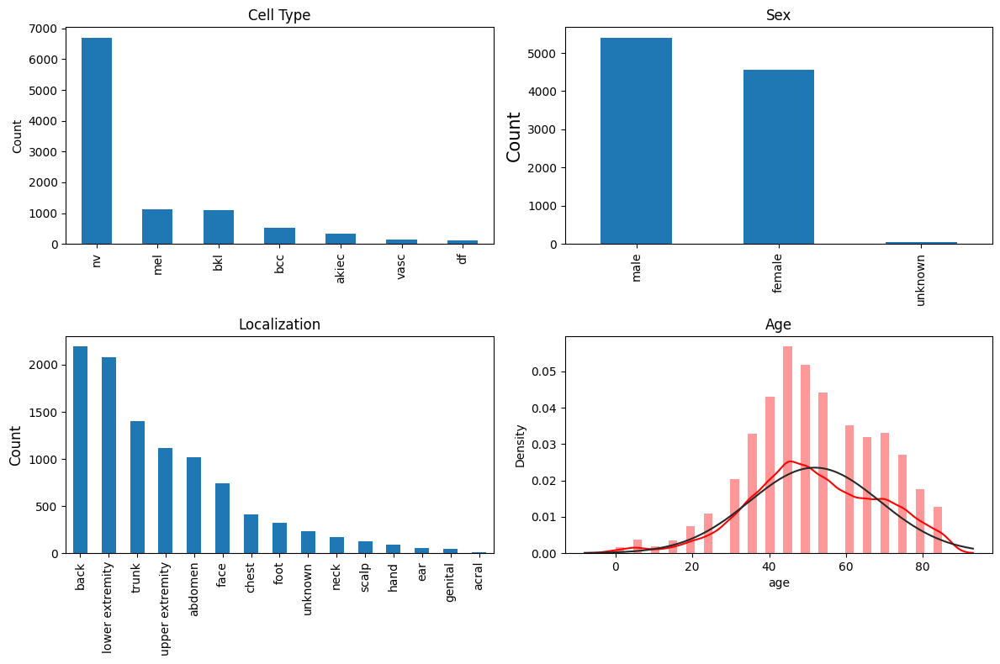

In [29]:
# Data distribution visualization
fig = plt.figure(figsize=(12,8))

ax1 = fig.add_subplot(221)
skin_df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type');

ax2 = fig.add_subplot(222)
skin_df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex');

ax3 = fig.add_subplot(223)
skin_df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count',size=12)
ax3.set_title('Localization')

ax4 = fig.add_subplot(224)
sample_age = skin_df[pd.notnull(skin_df['age'])]
sns.distplot(sample_age['age'], fit=stats.norm, color='red');
ax4.set_title('Age')

plt.tight_layout()
plt.show()

In [30]:
# Distribution of data into various classes 
from sklearn.utils import resample
print(skin_df['label'].value_counts())

5    6705
4    1113
2    1099
1     514
0     327
6     142
3     115
Name: label, dtype: int64


In [31]:
#Balance data.
# Many ways to balance data... you can also try assigning weights during model.fit
#Separate each classes, resample, and combine back into single dataframe

df_0 = skin_df[skin_df['label'] == 0]
df_1 = skin_df[skin_df['label'] == 1]
df_2 = skin_df[skin_df['label'] == 2]
df_3 = skin_df[skin_df['label'] == 3]
df_4 = skin_df[skin_df['label'] == 4]
df_5 = skin_df[skin_df['label'] == 5]
df_6 = skin_df[skin_df['label'] == 6]

In [32]:
n_samples=500 
df_0_balanced = resample(df_0, replace=True, n_samples=n_samples, random_state=42) 
df_1_balanced = resample(df_1, replace=True, n_samples=n_samples, random_state=42) 
df_2_balanced = resample(df_2, replace=True, n_samples=n_samples, random_state=42)
df_3_balanced = resample(df_3, replace=True, n_samples=n_samples, random_state=42)
df_4_balanced = resample(df_4, replace=True, n_samples=n_samples, random_state=42)
df_5_balanced = resample(df_5, replace=True, n_samples=n_samples, random_state=42)
df_6_balanced = resample(df_6, replace=True, n_samples=n_samples, random_state=42)

In [33]:
#Combined back to a single dataframe
skin_df_balanced = pd.concat([df_0_balanced, df_1_balanced, 
                              df_2_balanced, df_3_balanced, 
                              df_4_balanced, df_5_balanced, df_6_balanced])

In [34]:
#Check the distribution. All classes should be balanced now.
print(skin_df_balanced['label'].value_counts())

0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: label, dtype: int64


In [35]:
#Now time to read images based on image ID from the CSV file
#This is the safest way to read images as it ensures the right image is read for the right ID
image_path = {os.path.splitext(os.path.basename(x))[0]: x 
              for x in glob(os.path.join('dataverse_files/', '*', '*.jpg'))}

In [36]:
#Define the path and add as a new column
skin_df_balanced['path'] = skin_df['image_id'].map(image_path.get)
#Use the path to read images.
skin_df_balanced['image'] = skin_df_balanced['path'].map(lambda x: np.asarray(Image.open(x).resize((SIZE,SIZE))))

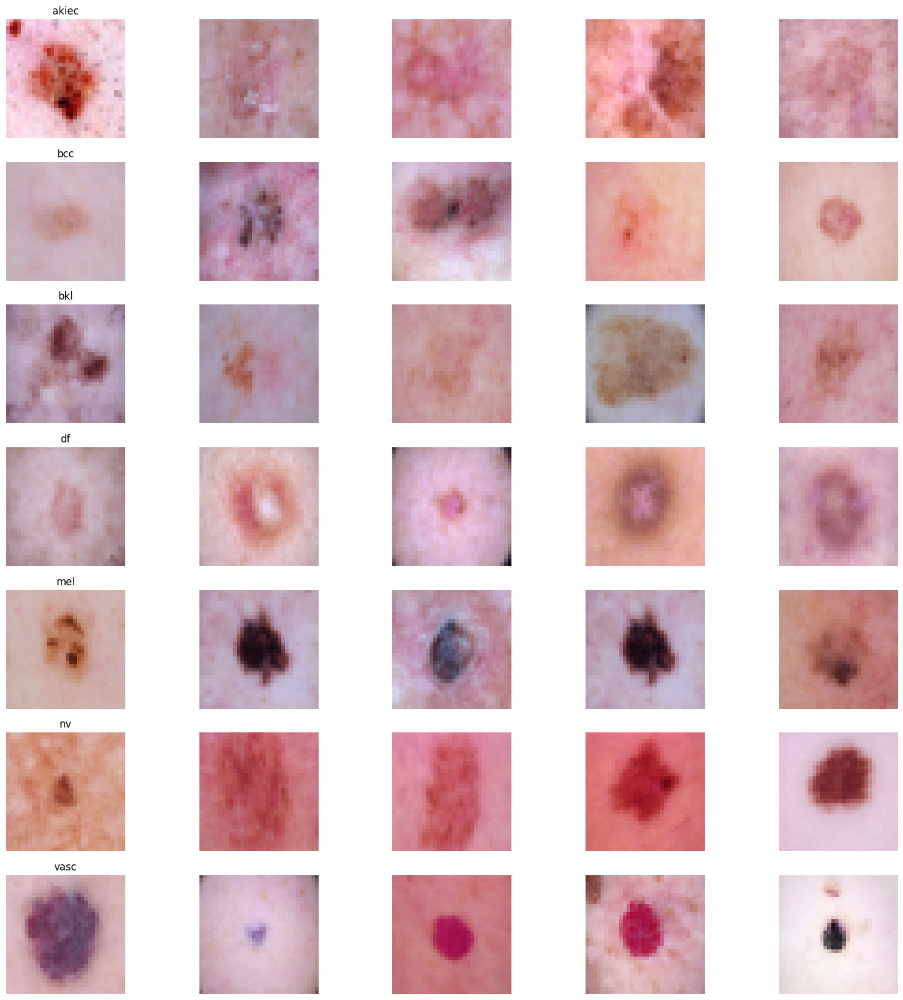

In [37]:
n_samples = 5  # number of samples for plotting
# Plotting
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

In [38]:
#Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X/255.  # Scale values to 0-1. You can also used standardscaler or other scaling methods.
Y=skin_df_balanced['label']  #Assign label values to Y
Y_cat = to_categorical(Y, num_classes=7) #Convert to categorical as this is a multiclass classification problem

In [39]:
#Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

In [2]:
#Define the model.
#I've used autokeras to find out the best model for this problem.
#You can also load pretrained networks such as mobilenet or VGG16

num_classes = 7

model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
#model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))  
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3),activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))  
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3),activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))  
model.add(Dropout(0.3))
model.add(Flatten())

model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['acc'])

NameError: name 'SIZE' is not defined

In [43]:
# Train
#You can also use generator to use augmentation during training.

batch_size = 16 
epochs = 30

In [44]:
history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size = batch_size,
    validation_data=(x_test, y_test),
    verbose=2)

Epoch 1/30
165/165 - 4s - loss: 1.8879 - acc: 0.2046 - val_loss: 1.8696 - val_acc: 0.2560 - 4s/epoch - 22ms/step
Epoch 2/30
165/165 - 2s - loss: 1.7699 - acc: 0.2636 - val_loss: 1.6955 - val_acc: 0.3189 - 2s/epoch - 11ms/step
Epoch 3/30
165/165 - 2s - loss: 1.5887 - acc: 0.3459 - val_loss: 1.5313 - val_acc: 0.3954 - 2s/epoch - 11ms/step
Epoch 4/30
165/165 - 2s - loss: 1.4646 - acc: 0.3977 - val_loss: 1.4957 - val_acc: 0.3829 - 2s/epoch - 12ms/step
Epoch 5/30
165/165 - 2s - loss: 1.4107 - acc: 0.4423 - val_loss: 1.4839 - val_acc: 0.4286 - 2s/epoch - 12ms/step
Epoch 6/30
165/165 - 2s - loss: 1.3894 - acc: 0.4480 - val_loss: 1.3340 - val_acc: 0.4811 - 2s/epoch - 12ms/step
Epoch 7/30
165/165 - 2s - loss: 1.3222 - acc: 0.4891 - val_loss: 1.3254 - val_acc: 0.4697 - 2s/epoch - 12ms/step
Epoch 8/30
165/165 - 2s - loss: 1.2869 - acc: 0.4834 - val_loss: 1.2796 - val_acc: 0.4560 - 2s/epoch - 11ms/step
Epoch 9/30
165/165 - 2s - loss: 1.2514 - acc: 0.5200 - val_loss: 1.2120 - val_acc: 0.4949 - 2s/e

In [45]:
score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

28/28 [==============================] - 1s 8ms/step - loss: 1.2137 - acc: 0.5543
Test accuracy: 0.5542857050895691


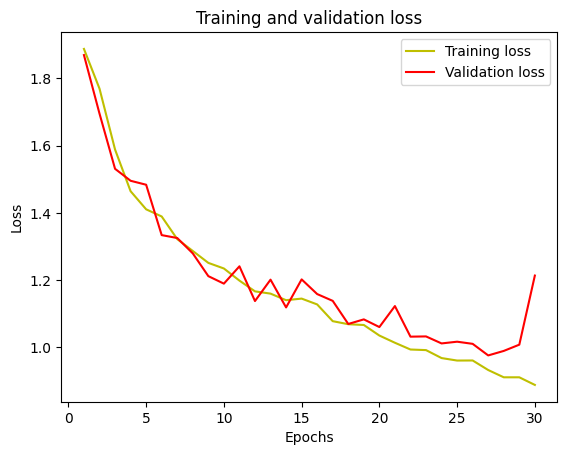

In [46]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

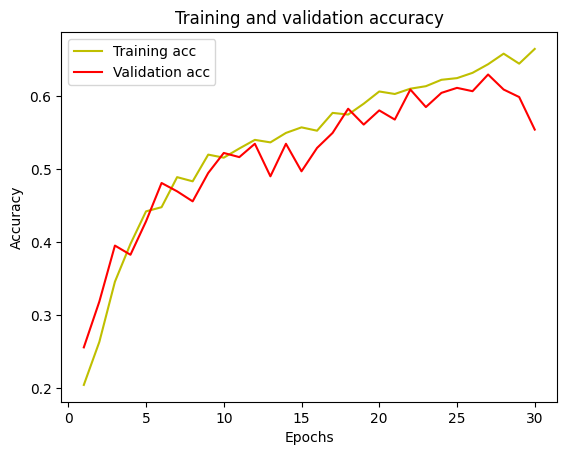

In [47]:
acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [48]:
# Prediction on test data
y_pred = model.predict(x_test)
# Convert predictions classes to one hot vectors 
y_pred_classes = np.argmax(y_pred, axis = 1) 
# Convert test data to one hot vectors
y_true = np.argmax(y_test, axis = 1) 

28/28 [==============================] - 2s 6ms/step


<AxesSubplot: >

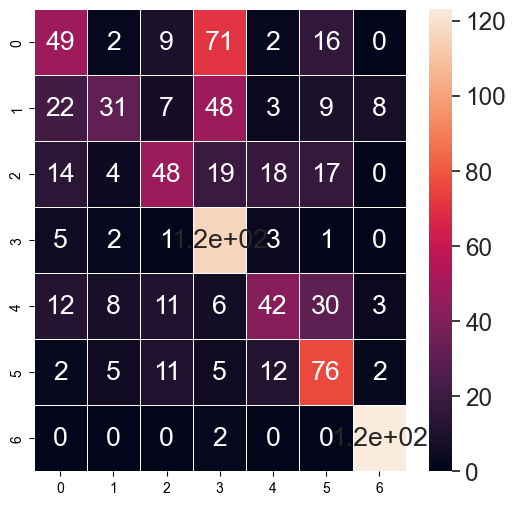

In [49]:
#Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6,6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

Text(0, 0.5, 'Fraction of incorrect predictions')

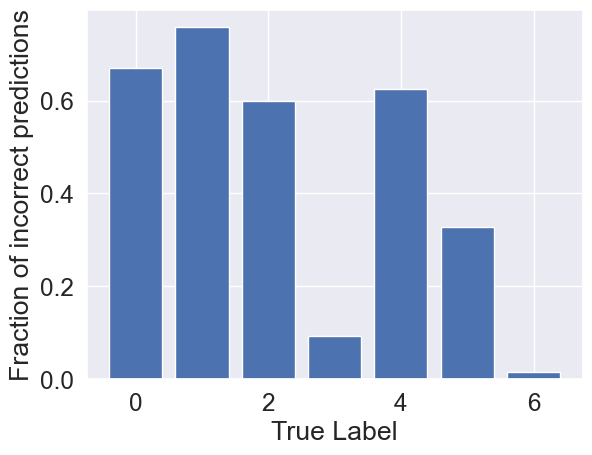

In [50]:
#PLot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')